# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

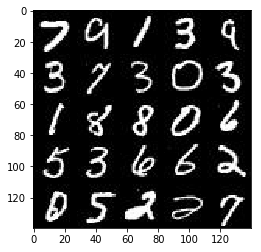

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

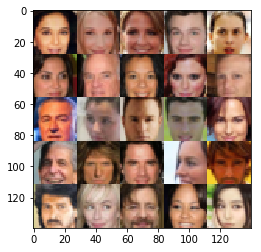

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data, learning rate)

In [26]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(dtype = tf.float32, shape = (None, image_width, image_height, image_channels), name = "input_real")
    input_z = tf.placeholder(dtype = tf.float32,shape = (None, z_dim), name = "input_z")
    lr = tf.placeholder(dtype = tf.float32, shape=(None), name = 'learning_rate')
    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = not is_train
    rate=0.2 #dropout rate
    with tf.variable_scope('generator', reuse = reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * x1, x1)
        
    
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), activation = None)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * x2, x2)
        x2 = tf.layers.dropout(x2, rate, training=is_train)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), activation = None)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2 * x3, x3)
        x3 = tf.layers.dropout(x3, rate, training=is_train)
 
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(),  activation = None)
        
        
        out = tf.tanh(logits)
        
        return out




"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    smooth = 0.1
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1.0 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [15]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [28]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #saver = tf.train.Saver()
    losses = []
    samples = []
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
        
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
        
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)  #learning_rate or lr?
    
    steps = 0
    
    print_every = 20
    show_every = 50
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images*=2.0
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images,input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, lr:learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

        #saver.save(sess, './checkpoints/generator.ckpt')

    #with open('samples.pkl', 'wb') as f:
    #    pkl.dump(samples, f)
    
    return losses, samples    
    

                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.4862... Generator Loss: 7.6041
Epoch 1/2... Discriminator Loss: 1.4543... Generator Loss: 0.6171


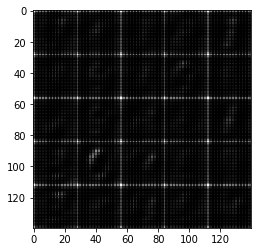

Epoch 1/2... Discriminator Loss: 1.2559... Generator Loss: 1.6820
Epoch 1/2... Discriminator Loss: 1.3666... Generator Loss: 0.7124
Epoch 1/2... Discriminator Loss: 1.2575... Generator Loss: 1.3201


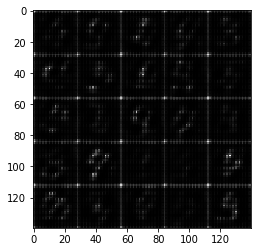

Epoch 1/2... Discriminator Loss: 1.2067... Generator Loss: 0.9685
Epoch 1/2... Discriminator Loss: 1.2254... Generator Loss: 1.4368


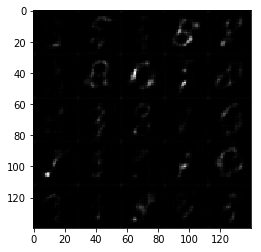

Epoch 1/2... Discriminator Loss: 1.4871... Generator Loss: 1.8829
Epoch 1/2... Discriminator Loss: 1.2854... Generator Loss: 0.6630
Epoch 1/2... Discriminator Loss: 1.2803... Generator Loss: 0.7046


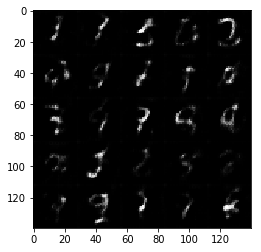

Epoch 1/2... Discriminator Loss: 1.2217... Generator Loss: 0.8067
Epoch 1/2... Discriminator Loss: 1.2976... Generator Loss: 1.3918


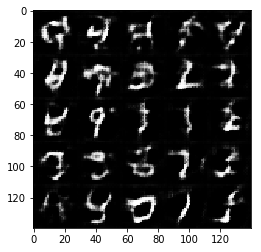

Epoch 1/2... Discriminator Loss: 1.2717... Generator Loss: 0.9114
Epoch 1/2... Discriminator Loss: 1.2420... Generator Loss: 0.7640
Epoch 1/2... Discriminator Loss: 1.4652... Generator Loss: 1.8688


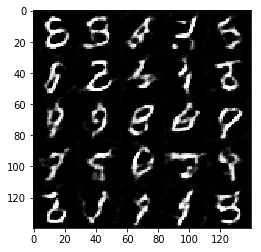

Epoch 1/2... Discriminator Loss: 1.1942... Generator Loss: 0.7554
Epoch 1/2... Discriminator Loss: 1.1601... Generator Loss: 0.9079


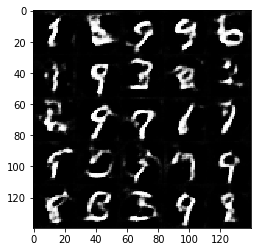

Epoch 1/2... Discriminator Loss: 1.1490... Generator Loss: 1.0015
Epoch 1/2... Discriminator Loss: 1.1628... Generator Loss: 0.8067
Epoch 1/2... Discriminator Loss: 1.1804... Generator Loss: 0.9854


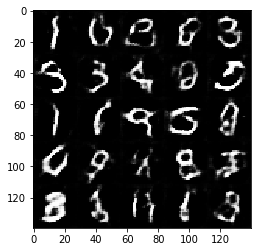

Epoch 1/2... Discriminator Loss: 1.1186... Generator Loss: 1.1019
Epoch 1/2... Discriminator Loss: 1.2651... Generator Loss: 0.6206


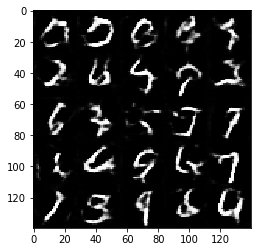

Epoch 1/2... Discriminator Loss: 1.1391... Generator Loss: 1.0169
Epoch 1/2... Discriminator Loss: 1.1064... Generator Loss: 0.8685
Epoch 1/2... Discriminator Loss: 1.1281... Generator Loss: 0.9917


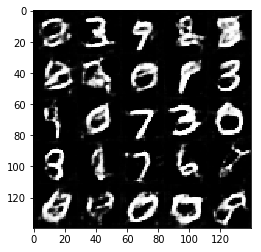

Epoch 1/2... Discriminator Loss: 1.1437... Generator Loss: 0.7836
Epoch 1/2... Discriminator Loss: 1.2740... Generator Loss: 0.6611


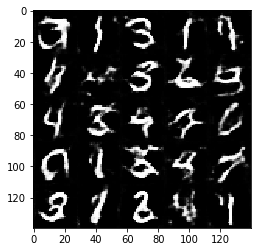

Epoch 1/2... Discriminator Loss: 1.3291... Generator Loss: 0.5293
Epoch 1/2... Discriminator Loss: 1.5081... Generator Loss: 0.4450
Epoch 1/2... Discriminator Loss: 0.9958... Generator Loss: 1.3607


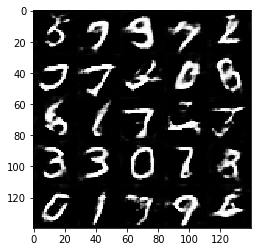

Epoch 1/2... Discriminator Loss: 1.4878... Generator Loss: 2.2292
Epoch 1/2... Discriminator Loss: 1.0508... Generator Loss: 1.1508


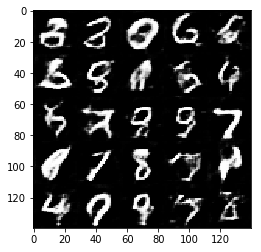

Epoch 1/2... Discriminator Loss: 1.3890... Generator Loss: 0.8106
Epoch 1/2... Discriminator Loss: 1.1674... Generator Loss: 1.0226
Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 1.6591


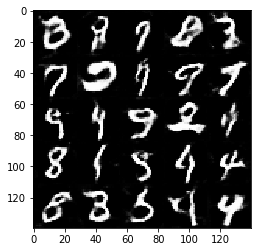

Epoch 1/2... Discriminator Loss: 1.1954... Generator Loss: 0.8411
Epoch 1/2... Discriminator Loss: 1.1094... Generator Loss: 1.4938


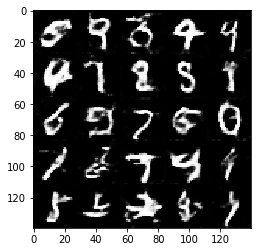

Epoch 1/2... Discriminator Loss: 1.0470... Generator Loss: 1.4884
Epoch 1/2... Discriminator Loss: 1.0178... Generator Loss: 1.6878
Epoch 1/2... Discriminator Loss: 1.8663... Generator Loss: 2.8729


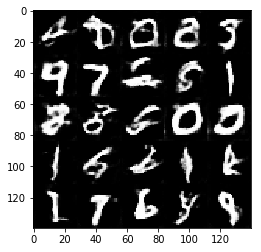

Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 0.7215
Epoch 1/2... Discriminator Loss: 1.4242... Generator Loss: 0.5058


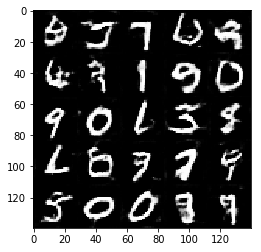

Epoch 1/2... Discriminator Loss: 1.1615... Generator Loss: 1.0423
Epoch 1/2... Discriminator Loss: 1.1138... Generator Loss: 0.9564
Epoch 1/2... Discriminator Loss: 1.2724... Generator Loss: 0.6068


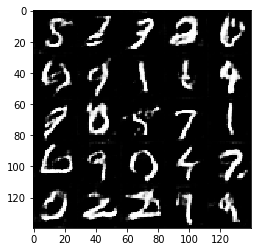

Epoch 1/2... Discriminator Loss: 1.1517... Generator Loss: 0.6879
Epoch 2/2... Discriminator Loss: 1.1069... Generator Loss: 0.8198


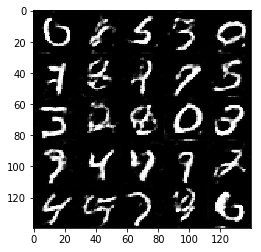

Epoch 2/2... Discriminator Loss: 1.0055... Generator Loss: 1.2589
Epoch 2/2... Discriminator Loss: 0.8499... Generator Loss: 1.1748
Epoch 2/2... Discriminator Loss: 1.1103... Generator Loss: 1.0716


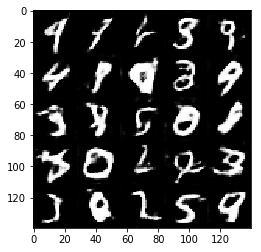

Epoch 2/2... Discriminator Loss: 0.9565... Generator Loss: 1.0247
Epoch 2/2... Discriminator Loss: 1.0258... Generator Loss: 0.8859


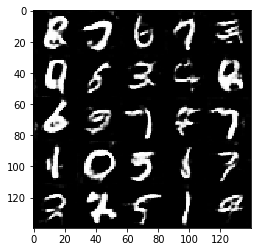

Epoch 2/2... Discriminator Loss: 1.0614... Generator Loss: 0.8500
Epoch 2/2... Discriminator Loss: 0.9778... Generator Loss: 0.8581
Epoch 2/2... Discriminator Loss: 1.1464... Generator Loss: 0.7488


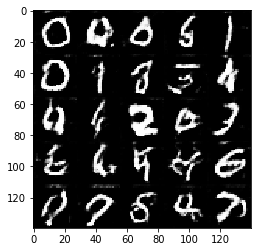

Epoch 2/2... Discriminator Loss: 0.8498... Generator Loss: 1.3610
Epoch 2/2... Discriminator Loss: 1.2762... Generator Loss: 0.6073


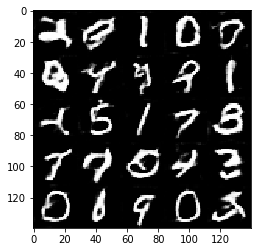

Epoch 2/2... Discriminator Loss: 1.0273... Generator Loss: 2.1706
Epoch 2/2... Discriminator Loss: 0.9757... Generator Loss: 0.8700
Epoch 2/2... Discriminator Loss: 0.7081... Generator Loss: 1.6366


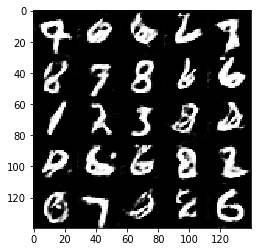

Epoch 2/2... Discriminator Loss: 0.9533... Generator Loss: 0.9006
Epoch 2/2... Discriminator Loss: 0.8210... Generator Loss: 1.1194


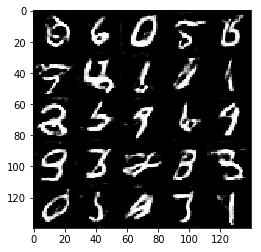

Epoch 2/2... Discriminator Loss: 1.0993... Generator Loss: 2.4129
Epoch 2/2... Discriminator Loss: 0.9302... Generator Loss: 1.0453
Epoch 2/2... Discriminator Loss: 1.0163... Generator Loss: 1.0332


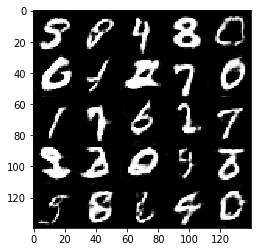

Epoch 2/2... Discriminator Loss: 0.9024... Generator Loss: 1.1570
Epoch 2/2... Discriminator Loss: 0.7866... Generator Loss: 1.5080


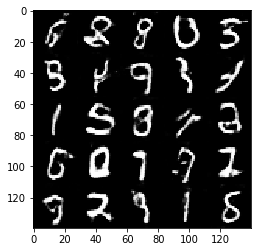

Epoch 2/2... Discriminator Loss: 1.0054... Generator Loss: 0.9984
Epoch 2/2... Discriminator Loss: 0.7198... Generator Loss: 1.4758
Epoch 2/2... Discriminator Loss: 1.2945... Generator Loss: 2.3272


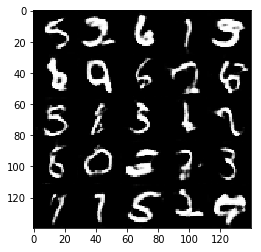

Epoch 2/2... Discriminator Loss: 0.7339... Generator Loss: 1.6988
Epoch 2/2... Discriminator Loss: 1.0659... Generator Loss: 1.2033


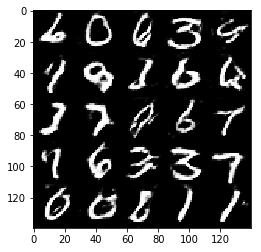

Epoch 2/2... Discriminator Loss: 0.7443... Generator Loss: 1.4620
Epoch 2/2... Discriminator Loss: 1.7458... Generator Loss: 3.5460
Epoch 2/2... Discriminator Loss: 0.5912... Generator Loss: 1.7545


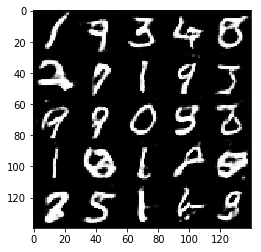

Epoch 2/2... Discriminator Loss: 0.7770... Generator Loss: 1.2696
Epoch 2/2... Discriminator Loss: 1.0250... Generator Loss: 0.9692


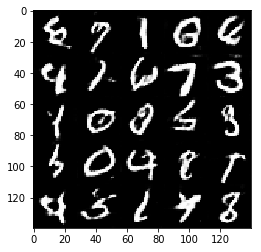

Epoch 2/2... Discriminator Loss: 0.9140... Generator Loss: 1.0755
Epoch 2/2... Discriminator Loss: 0.6818... Generator Loss: 1.6907
Epoch 2/2... Discriminator Loss: 1.0113... Generator Loss: 2.4626


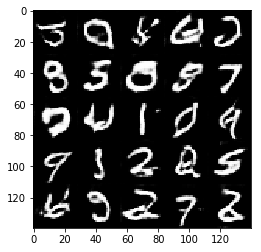

Epoch 2/2... Discriminator Loss: 0.7627... Generator Loss: 1.1144
Epoch 2/2... Discriminator Loss: 0.6692... Generator Loss: 2.3676


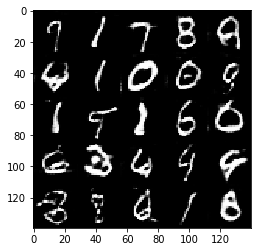

Epoch 2/2... Discriminator Loss: 0.6063... Generator Loss: 1.9428
Epoch 2/2... Discriminator Loss: 0.6383... Generator Loss: 2.2505
Epoch 2/2... Discriminator Loss: 0.6944... Generator Loss: 2.0365


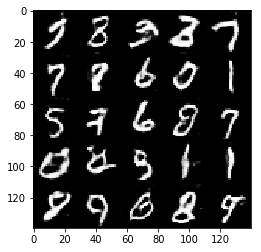

Epoch 2/2... Discriminator Loss: 1.0067... Generator Loss: 1.0239
Epoch 2/2... Discriminator Loss: 1.8986... Generator Loss: 4.6471


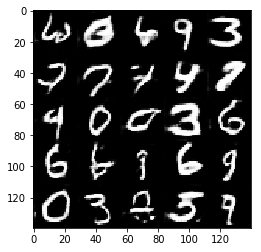

Epoch 2/2... Discriminator Loss: 0.7868... Generator Loss: 2.0584
Epoch 2/2... Discriminator Loss: 1.0879... Generator Loss: 0.8642
Epoch 2/2... Discriminator Loss: 0.7942... Generator Loss: 1.3791


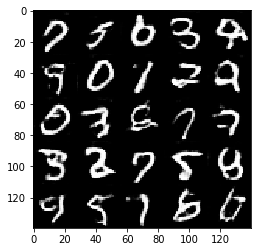

Epoch 2/2... Discriminator Loss: 0.6206... Generator Loss: 1.7914
Epoch 2/2... Discriminator Loss: 1.5652... Generator Loss: 0.6049


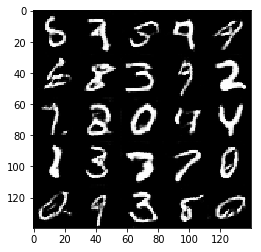

Epoch 2/2... Discriminator Loss: 0.7473... Generator Loss: 1.4162


In [29]:
batch_size = 64
z_dim = 100
learning_rate = 1e-3
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.3227... Generator Loss: 3.4466
Epoch 1/1... Discriminator Loss: 1.2825... Generator Loss: 1.1458


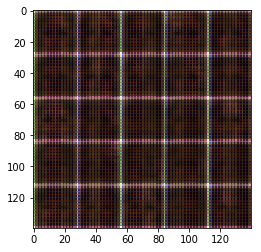

Epoch 1/1... Discriminator Loss: 1.2528... Generator Loss: 0.9013
Epoch 1/1... Discriminator Loss: 1.5446... Generator Loss: 0.5605
Epoch 1/1... Discriminator Loss: 1.2746... Generator Loss: 1.7025


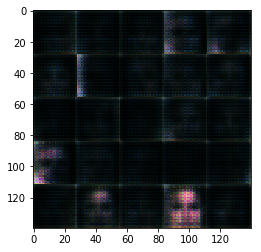

Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 1.1645
Epoch 1/1... Discriminator Loss: 2.8535... Generator Loss: 4.3134


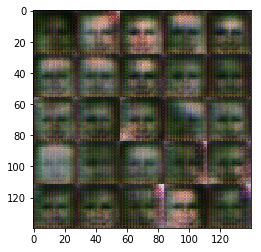

Epoch 1/1... Discriminator Loss: 1.8538... Generator Loss: 0.4878
Epoch 1/1... Discriminator Loss: 1.1219... Generator Loss: 0.8755
Epoch 1/1... Discriminator Loss: 0.9179... Generator Loss: 1.1862


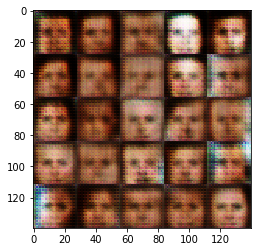

Epoch 1/1... Discriminator Loss: 1.1498... Generator Loss: 1.0701
Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.6196


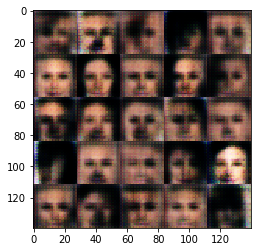

Epoch 1/1... Discriminator Loss: 1.2302... Generator Loss: 0.9419
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.8161
Epoch 1/1... Discriminator Loss: 1.2693... Generator Loss: 1.1323


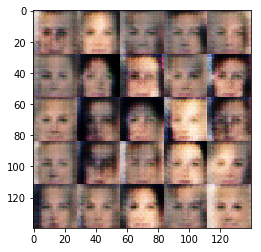

Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 0.9346
Epoch 1/1... Discriminator Loss: 1.5889... Generator Loss: 0.7167


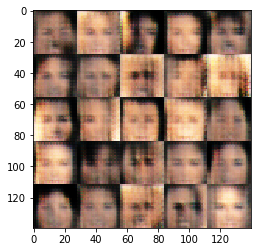

Epoch 1/1... Discriminator Loss: 1.8168... Generator Loss: 0.3525
Epoch 1/1... Discriminator Loss: 1.2466... Generator Loss: 1.0784
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 1.3810


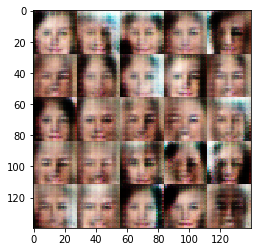

Epoch 1/1... Discriminator Loss: 1.6326... Generator Loss: 0.4125
Epoch 1/1... Discriminator Loss: 1.5514... Generator Loss: 0.7522


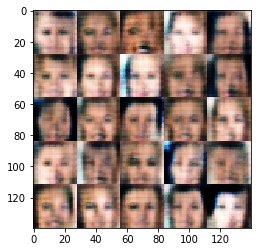

Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.9883
Epoch 1/1... Discriminator Loss: 1.4956... Generator Loss: 0.6255
Epoch 1/1... Discriminator Loss: 1.4659... Generator Loss: 0.9323


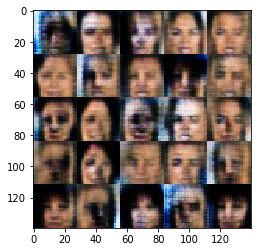

Epoch 1/1... Discriminator Loss: 1.2216... Generator Loss: 0.9518
Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 0.6899


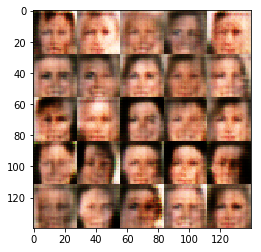

Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.2094... Generator Loss: 1.2212
Epoch 1/1... Discriminator Loss: 1.8704... Generator Loss: 0.4291


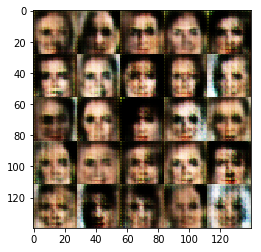

Epoch 1/1... Discriminator Loss: 1.2049... Generator Loss: 0.8439
Epoch 1/1... Discriminator Loss: 1.6247... Generator Loss: 0.7743


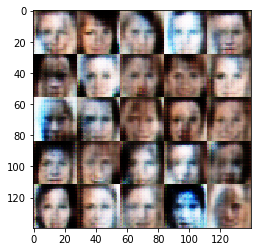

Epoch 1/1... Discriminator Loss: 1.5471... Generator Loss: 0.7712
Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.9339
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 1.0225


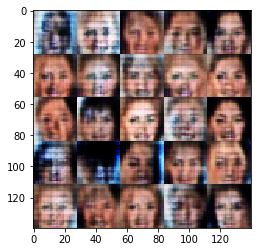

Epoch 1/1... Discriminator Loss: 1.3789... Generator Loss: 1.1313
Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.6986


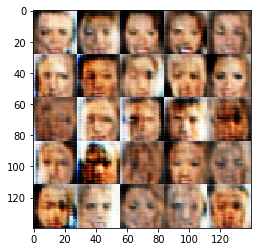

Epoch 1/1... Discriminator Loss: 1.6321... Generator Loss: 0.6397
Epoch 1/1... Discriminator Loss: 1.7320... Generator Loss: 0.4251
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.9791


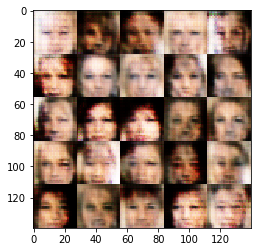

Epoch 1/1... Discriminator Loss: 1.5643... Generator Loss: 1.4081
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.9046


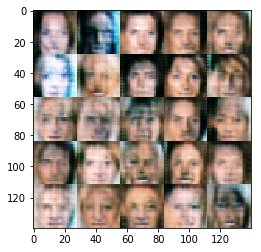

Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.6871
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 1.4432... Generator Loss: 0.6775


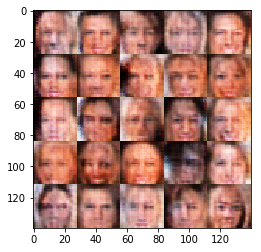

Epoch 1/1... Discriminator Loss: 1.4550... Generator Loss: 1.1108
Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.8997


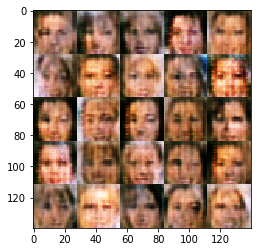

Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.9502
Epoch 1/1... Discriminator Loss: 1.5078... Generator Loss: 0.5991
Epoch 1/1... Discriminator Loss: 1.2628... Generator Loss: 0.7623


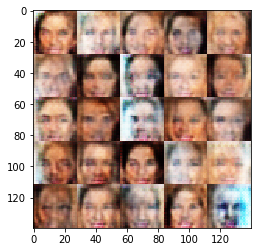

Epoch 1/1... Discriminator Loss: 1.2634... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 0.9437


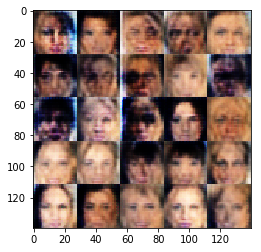

Epoch 1/1... Discriminator Loss: 1.3382... Generator Loss: 0.8324
Epoch 1/1... Discriminator Loss: 1.3342... Generator Loss: 0.9438
Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.7127


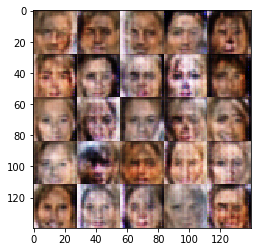

Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 1.0267


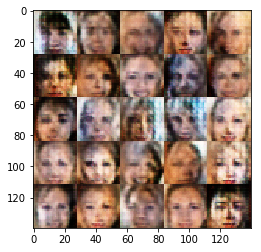

Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.8027
Epoch 1/1... Discriminator Loss: 1.5666... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.8074


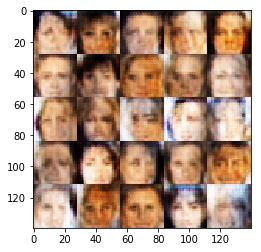

Epoch 1/1... Discriminator Loss: 1.3399... Generator Loss: 0.7670
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.8214


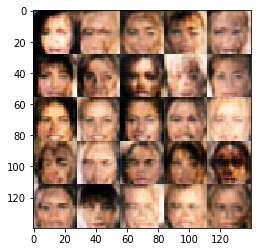

Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 1.2064... Generator Loss: 0.8629


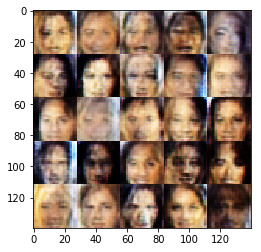

Epoch 1/1... Discriminator Loss: 1.2470... Generator Loss: 0.8366
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.6448


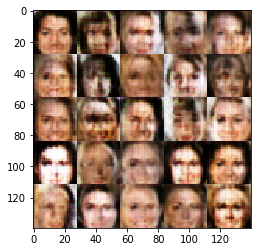

Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.2650... Generator Loss: 0.6834
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.7839


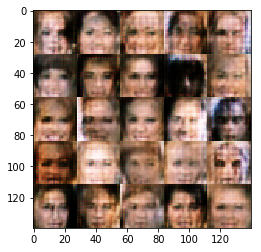

Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.8707
Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.8178


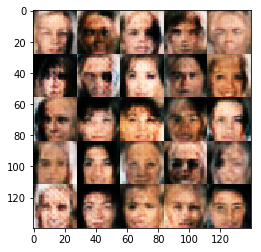

Epoch 1/1... Discriminator Loss: 1.6286... Generator Loss: 0.6684
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.9265
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.8213


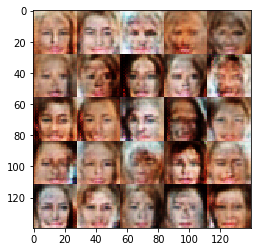

Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.9236
Epoch 1/1... Discriminator Loss: 1.4554... Generator Loss: 0.6370


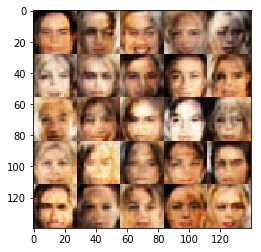

Epoch 1/1... Discriminator Loss: 1.2818... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.7261
Epoch 1/1... Discriminator Loss: 1.4390... Generator Loss: 0.4688


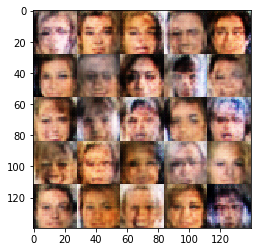

Epoch 1/1... Discriminator Loss: 1.5323... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.9183


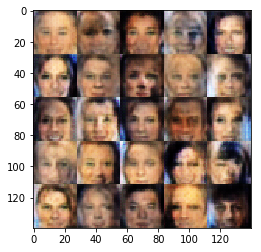

Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.8691
Epoch 1/1... Discriminator Loss: 1.4214... Generator Loss: 0.8215
Epoch 1/1... Discriminator Loss: 1.2998... Generator Loss: 1.1356


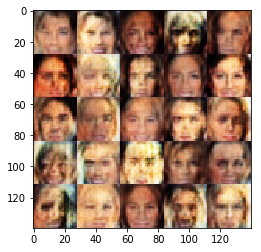

Epoch 1/1... Discriminator Loss: 1.2906... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.7742


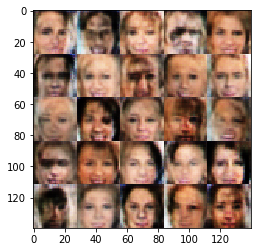

Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.9009
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 0.8922


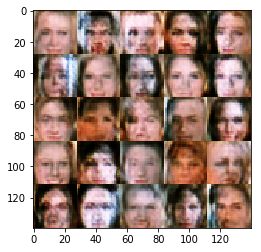

Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.8486
Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.6704


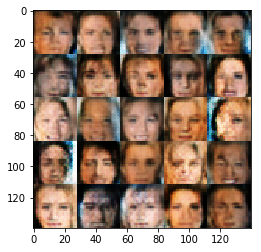

Epoch 1/1... Discriminator Loss: 1.2438... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.6008
Epoch 1/1... Discriminator Loss: 1.1467... Generator Loss: 0.9156


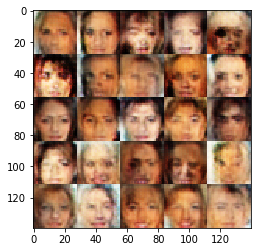

Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 0.8498
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.6588


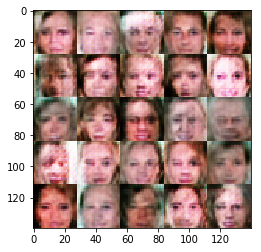

Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.9062
Epoch 1/1... Discriminator Loss: 1.4680... Generator Loss: 0.5910
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.9067


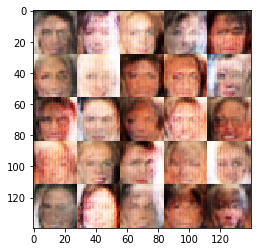

Epoch 1/1... Discriminator Loss: 1.4123... Generator Loss: 0.7646
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.7744


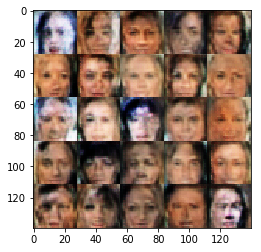

Epoch 1/1... Discriminator Loss: 1.3431... Generator Loss: 0.7761
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.7886
Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.7794


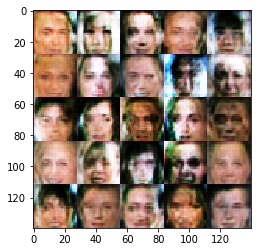

Epoch 1/1... Discriminator Loss: 1.2846... Generator Loss: 0.7225
Epoch 1/1... Discriminator Loss: 1.3093... Generator Loss: 0.8229


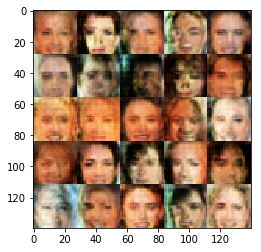

Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.7338
Epoch 1/1... Discriminator Loss: 1.3408... Generator Loss: 0.7959


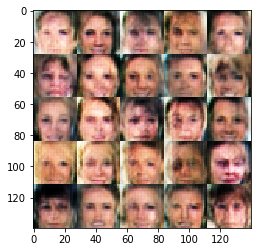

Epoch 1/1... Discriminator Loss: 1.1656... Generator Loss: 0.9135
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 1.0250


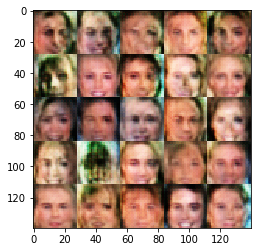

Epoch 1/1... Discriminator Loss: 1.2561... Generator Loss: 0.7523
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.8443
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.8676


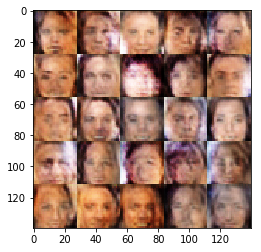

Epoch 1/1... Discriminator Loss: 1.3653... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.9469


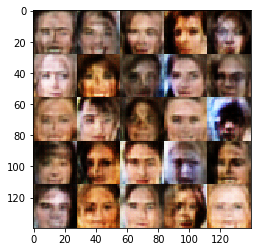

Epoch 1/1... Discriminator Loss: 1.5620... Generator Loss: 0.5900
Epoch 1/1... Discriminator Loss: 1.4003... Generator Loss: 0.9052
Epoch 1/1... Discriminator Loss: 1.4074... Generator Loss: 0.5779


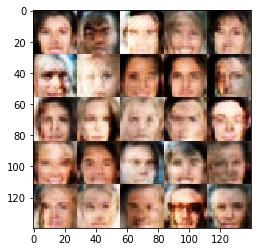

Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.9696
Epoch 1/1... Discriminator Loss: 1.2711... Generator Loss: 0.8616


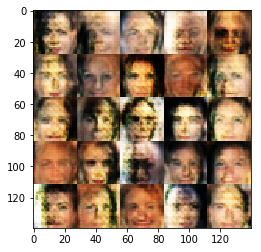

Epoch 1/1... Discriminator Loss: 1.2723... Generator Loss: 0.8806
Epoch 1/1... Discriminator Loss: 1.3565... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.9350


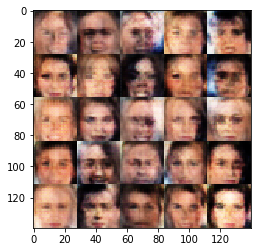

Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 0.8835
Epoch 1/1... Discriminator Loss: 1.2892... Generator Loss: 0.7399


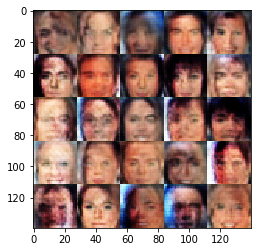

Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.8757
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 1.0301
Epoch 1/1... Discriminator Loss: 1.2849... Generator Loss: 0.8324


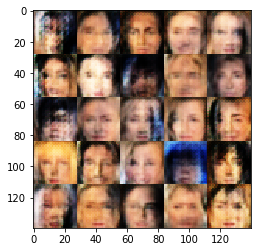

Epoch 1/1... Discriminator Loss: 1.2735... Generator Loss: 0.8620
Epoch 1/1... Discriminator Loss: 1.4089... Generator Loss: 0.6032


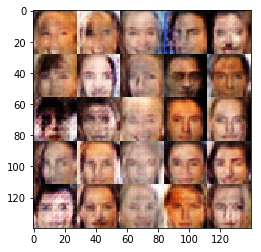

Epoch 1/1... Discriminator Loss: 1.2169... Generator Loss: 0.8949
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.8023


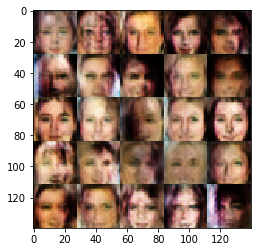

Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.9793
Epoch 1/1... Discriminator Loss: 1.2253... Generator Loss: 0.7753


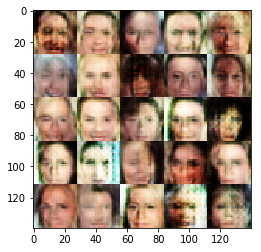

Epoch 1/1... Discriminator Loss: 1.3351... Generator Loss: 1.2596
Epoch 1/1... Discriminator Loss: 1.2254... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.7796


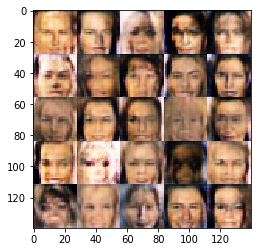

Epoch 1/1... Discriminator Loss: 1.2700... Generator Loss: 0.9706
Epoch 1/1... Discriminator Loss: 1.2664... Generator Loss: 0.8403


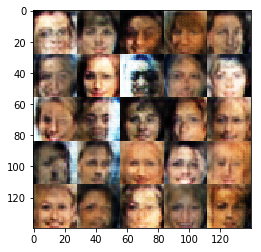

Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.7540
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 0.7868
Epoch 1/1... Discriminator Loss: 1.2172... Generator Loss: 0.7646


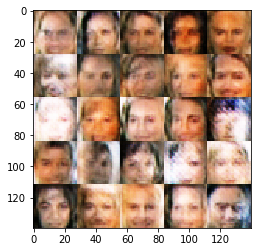

Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.3265... Generator Loss: 0.9191


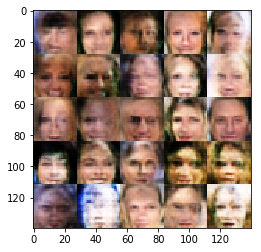

Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 1.0138
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.7740


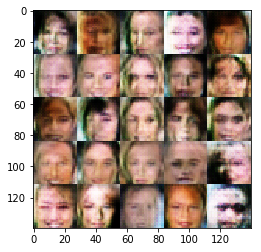

Epoch 1/1... Discriminator Loss: 1.3667... Generator Loss: 0.9033
Epoch 1/1... Discriminator Loss: 1.1902... Generator Loss: 0.9400


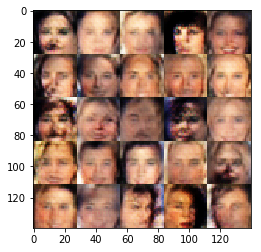

Epoch 1/1... Discriminator Loss: 1.4823... Generator Loss: 0.7614
Epoch 1/1... Discriminator Loss: 1.1976... Generator Loss: 0.9464
Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.7191


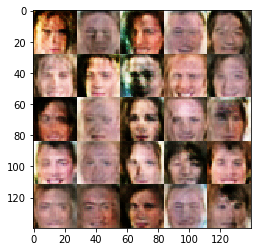

Epoch 1/1... Discriminator Loss: 1.4381... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.8947


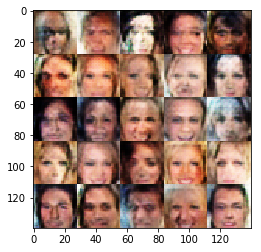

Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.3214... Generator Loss: 0.9493
Epoch 1/1... Discriminator Loss: 1.2825... Generator Loss: 0.9826


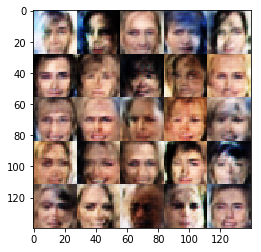

Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.8357
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.7431


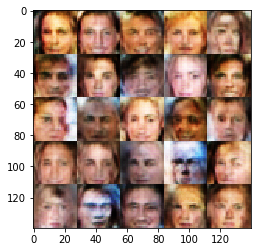

Epoch 1/1... Discriminator Loss: 1.3168... Generator Loss: 0.9112
Epoch 1/1... Discriminator Loss: 1.4322... Generator Loss: 0.8233
Epoch 1/1... Discriminator Loss: 1.4792... Generator Loss: 0.7284


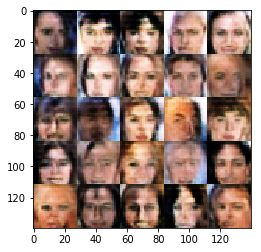

Epoch 1/1... Discriminator Loss: 1.4359... Generator Loss: 0.7332
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.8444


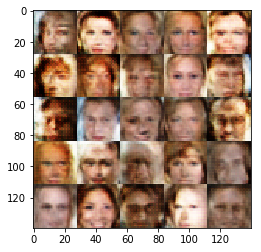

Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.9057
Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 0.7836
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.8475


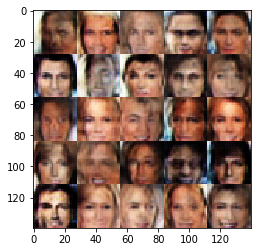

Epoch 1/1... Discriminator Loss: 1.3714... Generator Loss: 0.6574
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.8165


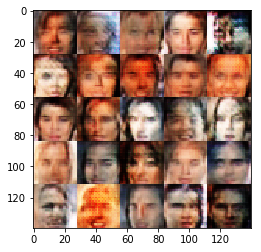

Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.2201... Generator Loss: 1.0035
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.8290


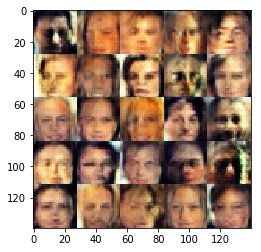

Epoch 1/1... Discriminator Loss: 1.2766... Generator Loss: 0.9217
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.7962


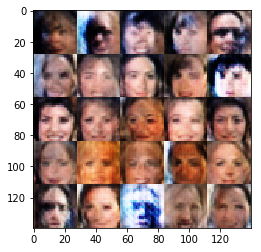

Epoch 1/1... Discriminator Loss: 1.3776... Generator Loss: 0.7668
Epoch 1/1... Discriminator Loss: 1.3204... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.9062


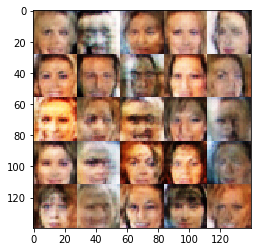

Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.7406
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.7836


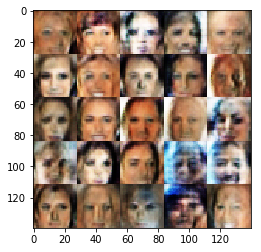

Epoch 1/1... Discriminator Loss: 1.3062... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.2777... Generator Loss: 0.9693
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.9124


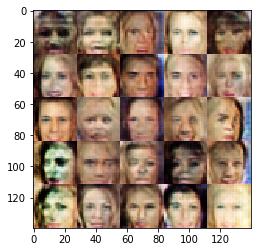

Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.8627
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.8204


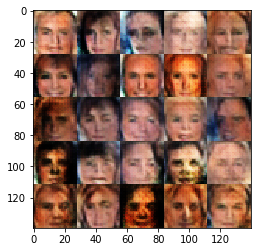

Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 0.7475
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 1.3145... Generator Loss: 0.7698


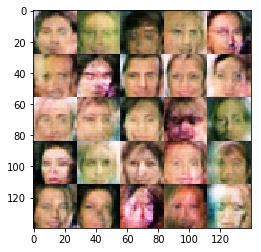

Epoch 1/1... Discriminator Loss: 1.3099... Generator Loss: 1.0282
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.7670


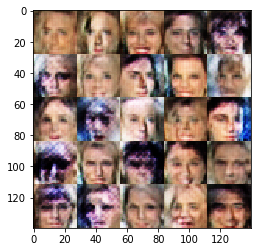

Epoch 1/1... Discriminator Loss: 1.4885... Generator Loss: 0.7534
Epoch 1/1... Discriminator Loss: 1.4157... Generator Loss: 0.7484
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.7770


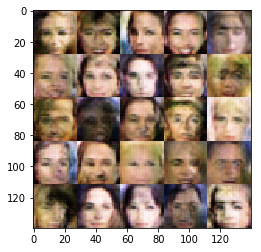

Epoch 1/1... Discriminator Loss: 1.4606... Generator Loss: 0.6544
Epoch 1/1... Discriminator Loss: 1.4432... Generator Loss: 0.8481


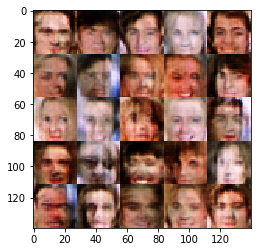

Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 1.0316
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.7984
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.7769


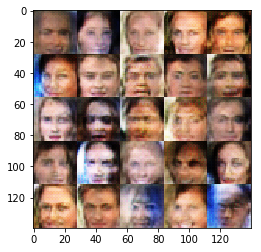

Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.8274
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.7416


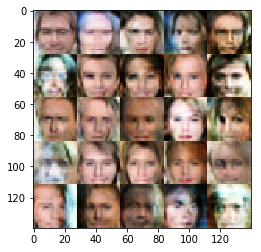

Epoch 1/1... Discriminator Loss: 1.3842... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.9052
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 1.0195


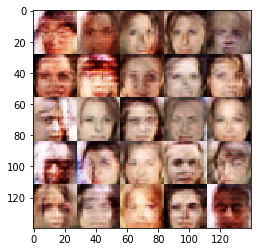

Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 1.0994
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.7251


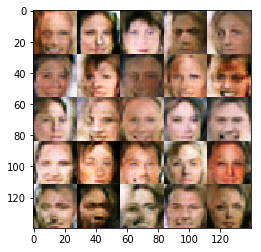

Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.7888
Epoch 1/1... Discriminator Loss: 1.2229... Generator Loss: 0.9994


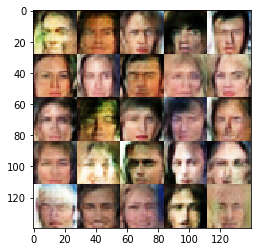

Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.7943
Epoch 1/1... Discriminator Loss: 1.3175... Generator Loss: 1.0019


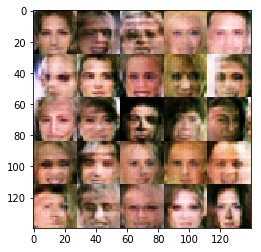

Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 1.0786
Epoch 1/1... Discriminator Loss: 1.2468... Generator Loss: 0.7825
Epoch 1/1... Discriminator Loss: 1.4158... Generator Loss: 0.7565


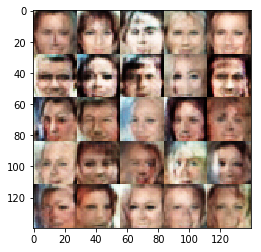

Epoch 1/1... Discriminator Loss: 1.3321... Generator Loss: 0.9167
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.7109


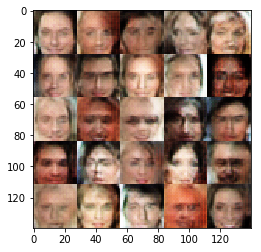

Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.7856
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 0.8355


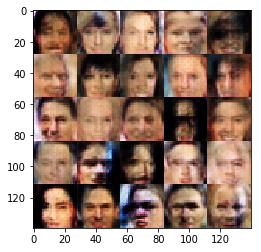

Epoch 1/1... Discriminator Loss: 1.2547... Generator Loss: 0.9353
Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 0.8914


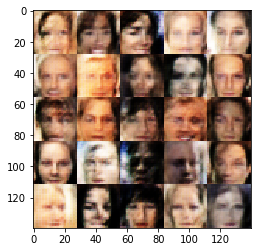

Epoch 1/1... Discriminator Loss: 1.3025... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.3142... Generator Loss: 0.9489
Epoch 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.5652


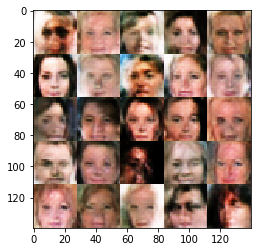

Epoch 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.8061
Epoch 1/1... Discriminator Loss: 1.2941... Generator Loss: 0.7825


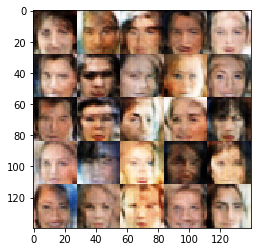

Epoch 1/1... Discriminator Loss: 1.2662... Generator Loss: 0.9741
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.7111


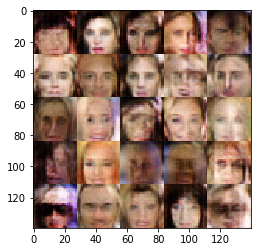

Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.8463
Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.8969


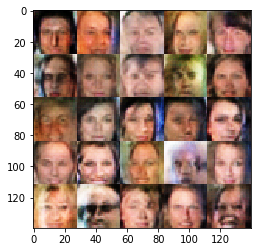

Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.7184
Epoch 1/1... Discriminator Loss: 1.2814... Generator Loss: 0.8740
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.7919


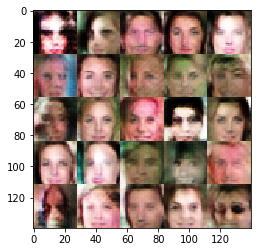

Epoch 1/1... Discriminator Loss: 1.3267... Generator Loss: 0.8045
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.6446


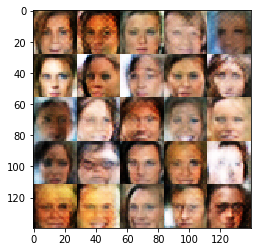

Epoch 1/1... Discriminator Loss: 1.4772... Generator Loss: 0.5392
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.8296
Epoch 1/1... Discriminator Loss: 1.2509... Generator Loss: 1.0638


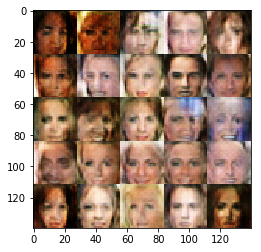

Epoch 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.8675
Epoch 1/1... Discriminator Loss: 1.1513... Generator Loss: 1.0418


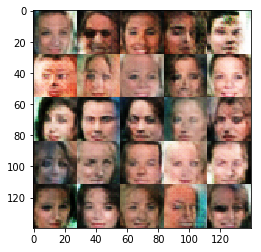

Epoch 1/1... Discriminator Loss: 1.3895... Generator Loss: 0.8636
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.7027
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 0.9097


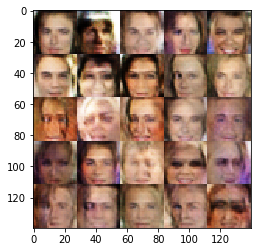

Epoch 1/1... Discriminator Loss: 1.2821... Generator Loss: 0.7767
Epoch 1/1... Discriminator Loss: 1.3382... Generator Loss: 0.8110


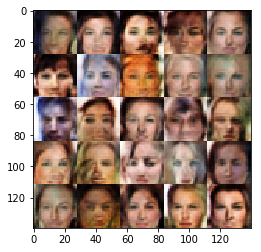

Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.8796
Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.8628
Epoch 1/1... Discriminator Loss: 1.3480... Generator Loss: 0.8937


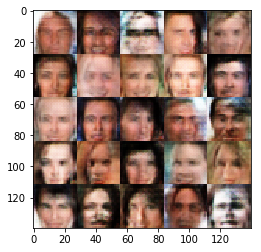

Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.7552
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.8064


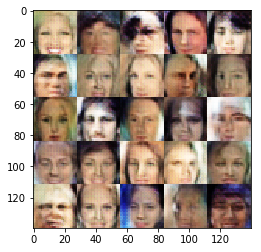

Epoch 1/1... Discriminator Loss: 1.2789... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.2994... Generator Loss: 0.8110


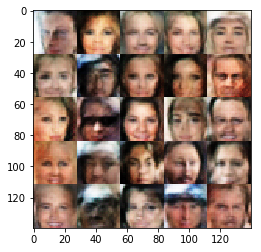

Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.8702
Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 0.7673


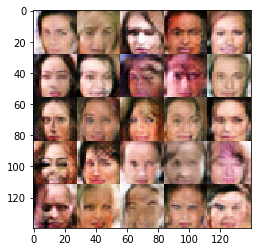

Epoch 1/1... Discriminator Loss: 1.3718... Generator Loss: 0.7808
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.6647
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.8110


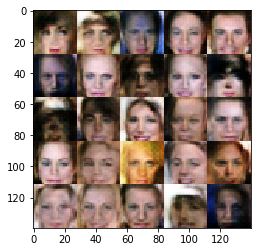

Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 1.3499... Generator Loss: 0.8058


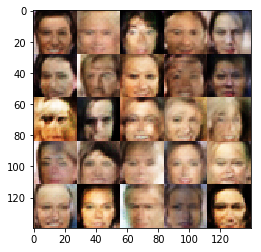

Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 0.6556
Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.8091
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.7740


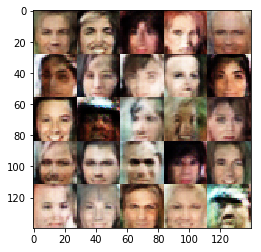

Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.7403
Epoch 1/1... Discriminator Loss: 1.3061... Generator Loss: 0.6980


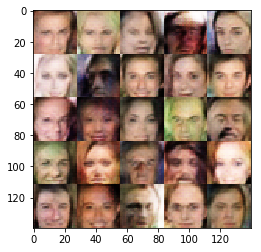

Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.9828
Epoch 1/1... Discriminator Loss: 1.3261... Generator Loss: 0.9024
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.7002


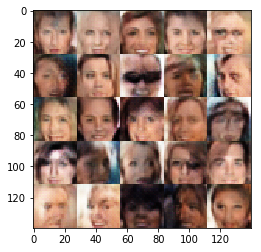

Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.9425
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.8910


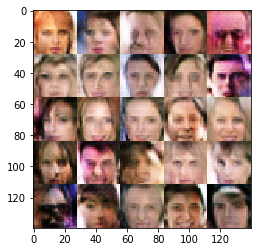

Epoch 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.6698
Epoch 1/1... Discriminator Loss: 1.1767... Generator Loss: 0.9417
Epoch 1/1... Discriminator Loss: 1.5094... Generator Loss: 0.7643


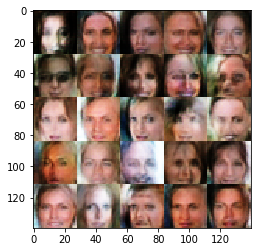

Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.6324


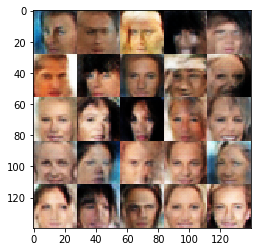

Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.8861
Epoch 1/1... Discriminator Loss: 1.3205... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.9308


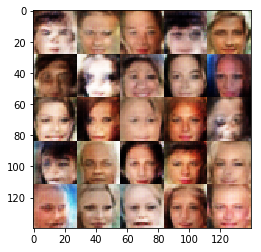

Epoch 1/1... Discriminator Loss: 1.2153... Generator Loss: 0.9279
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.6887


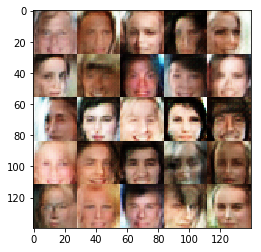

Epoch 1/1... Discriminator Loss: 1.2776... Generator Loss: 0.7858
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.7849


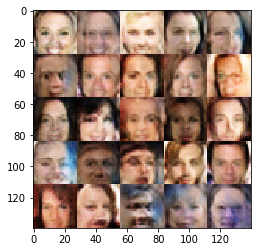

Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.8177
Epoch 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.8537


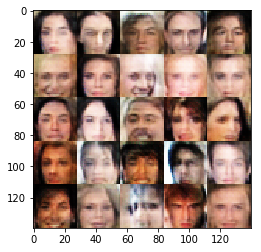

Epoch 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.8677
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 0.7193
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.7254


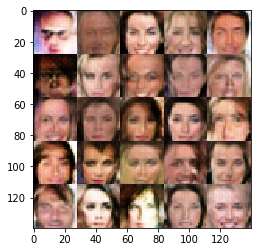

Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.5074... Generator Loss: 0.7897


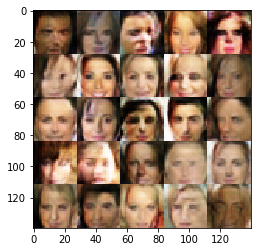

Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.6835
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 0.6641


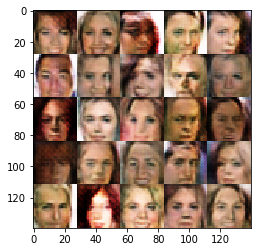

Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.9012
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.6833


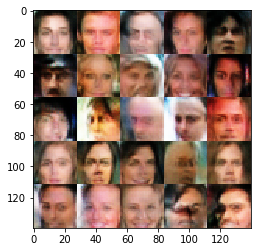

Epoch 1/1... Discriminator Loss: 1.3401... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.2623... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.9282


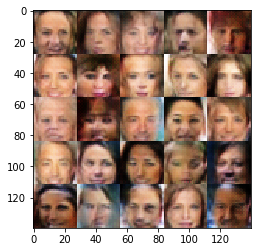

Epoch 1/1... Discriminator Loss: 1.1313... Generator Loss: 0.8652
Epoch 1/1... Discriminator Loss: 1.4706... Generator Loss: 1.2030


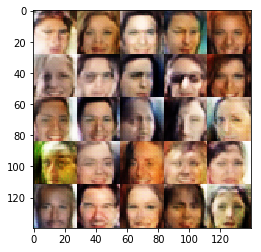

Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 1.0422
Epoch 1/1... Discriminator Loss: 1.3150... Generator Loss: 0.8198
Epoch 1/1... Discriminator Loss: 1.2593... Generator Loss: 0.8320


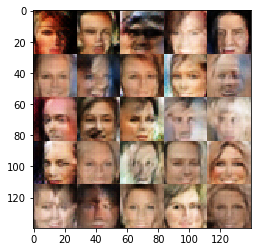

Epoch 1/1... Discriminator Loss: 1.2235... Generator Loss: 0.9473
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.7031


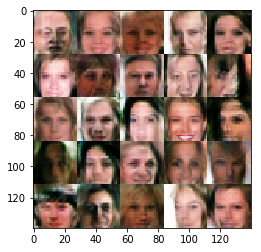

Epoch 1/1... Discriminator Loss: 1.2276... Generator Loss: 0.8731
Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.8178


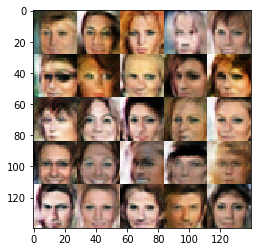

Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 1.2664... Generator Loss: 0.9559


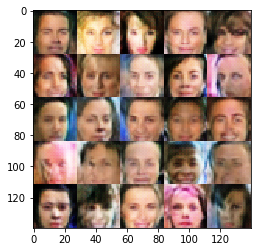

Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.1743... Generator Loss: 0.9459
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.6434


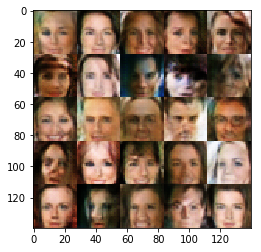

Epoch 1/1... Discriminator Loss: 1.3489... Generator Loss: 0.7317


In [30]:
batch_size = 32
z_dim = 100
learning_rate = 1e-3
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.